In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import LabelEncoder
from imblearn.under_sampling import NearMiss
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
df=pd.read_csv('/content/weatherAUS.csv.zip')
pd.set_option("display.max_columns",None)
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [ ]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [ ]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
145459,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,ESE,17.0,17.0,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [ ]:
df.shape

(145460, 23)

In [ ]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [ ]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [ ]:
df.isna().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [ ]:
df.describe(include='O')

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
count,145460,145460,135134,134894,141232,142199,142193
unique,3436,49,16,16,16,2,2
top,2013-11-12,Canberra,W,N,SE,No,No
freq,49,3436,9915,11758,10838,110319,110316


# Identifying Numerical and categorical  features

In [ ]:
numerical=[feature for feature in df.columns if df[feature].dtypes!='O']
categorical=[feature for feature in df.columns if feature not in numerical]
print("Total number of numerical column is {}". format(len(numerical)))
print("Numerical columns are {}".format(numerical))
print("\\"*300)
print("total number of categorical column is {}".format(len(categorical)))
print("Categorical columns are {}".format(categorical))

Total number of numerical column is 16
Numerical columns are ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\
total number of categorical column is 7
Categorical columns are ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


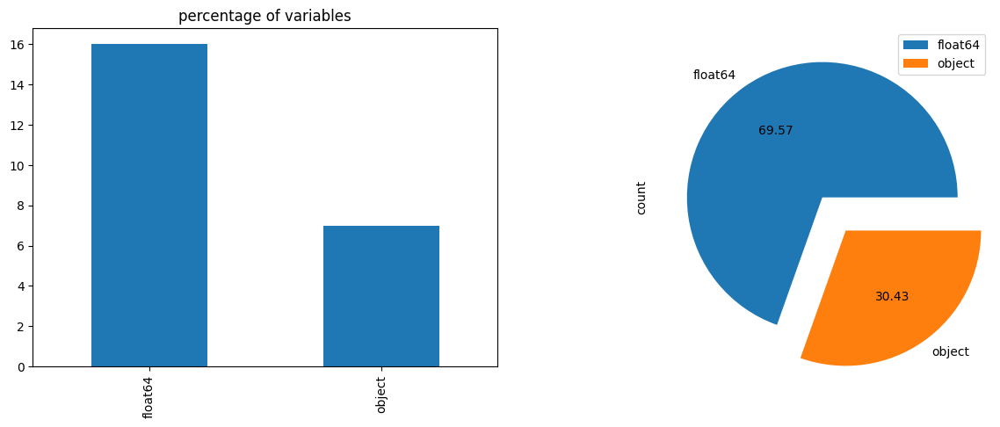

In [ ]:
plt.figure(figsize=(15,5))
ax1=plt.subplot(1,2,1)
plt.title("percentage of variables")
df.dtypes.value_counts().plot(kind='bar')
ax2=plt.subplot(1,2,2)
df.dtypes.value_counts().plot(kind='pie',autopct='%0.2f',ax=ax2,explode=[0,0.3])
plt.legend(df.dtypes.value_counts().index)


# Converting Date into year,month and day

In [ ]:
df['year']=pd.to_datetime(df['Date']).dt.year
df['month']=pd.to_datetime(df['Date']).dt.month
df['day']=pd.to_datetime(df['Date']).dt.day
df


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,2017,6,21
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,2017,6,22
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,2017,6,23
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No,2017,6,24


# **Univariate analysis**

#  Distribution plot for numerical features

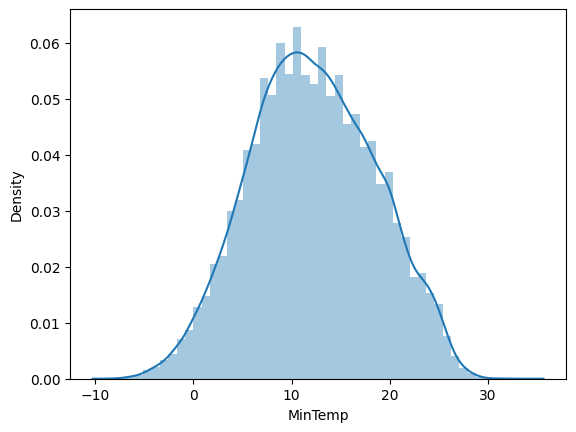

<Figure size 1500x1500 with 0 Axes>

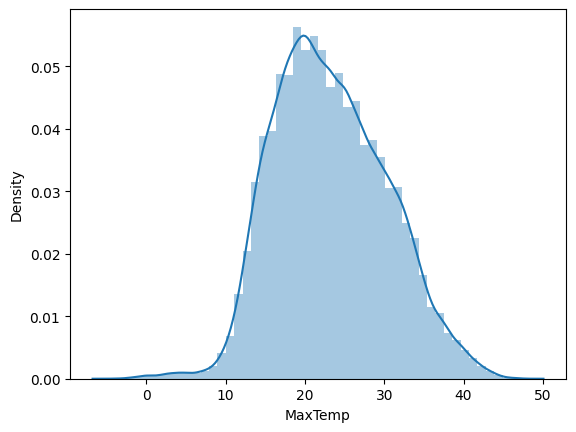

<Figure size 1500x1500 with 0 Axes>

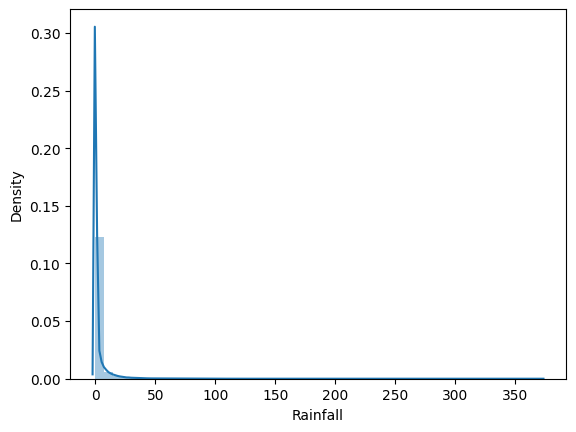

<Figure size 1500x1500 with 0 Axes>

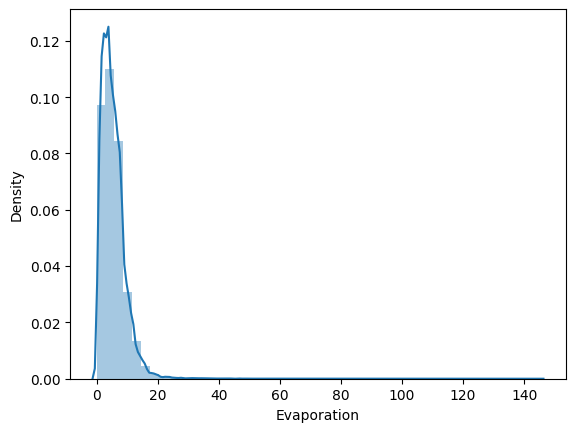

<Figure size 1500x1500 with 0 Axes>

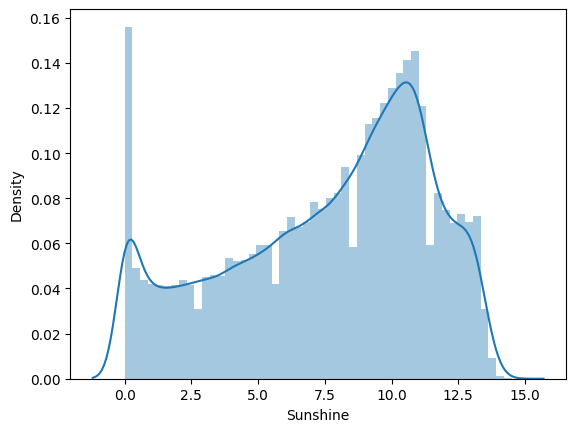

<Figure size 1500x1500 with 0 Axes>

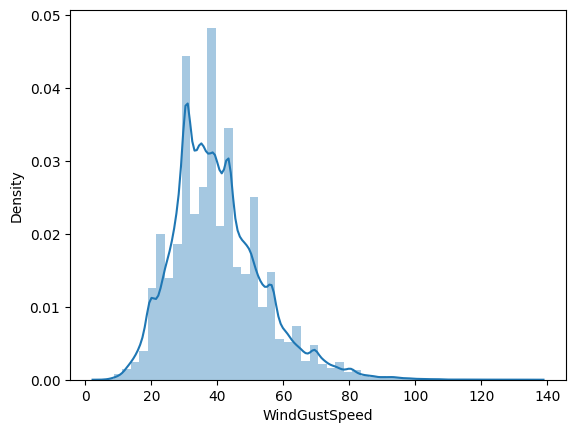

<Figure size 1500x1500 with 0 Axes>

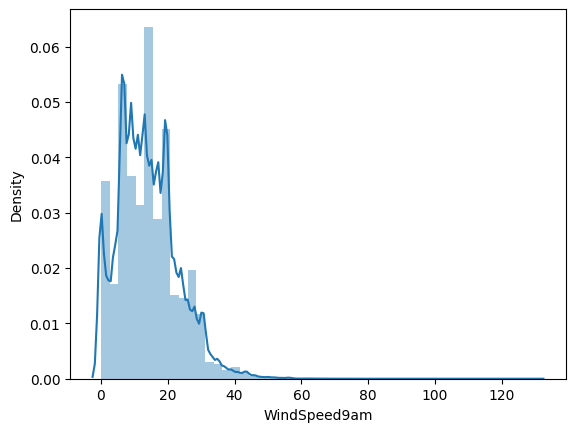

<Figure size 1500x1500 with 0 Axes>

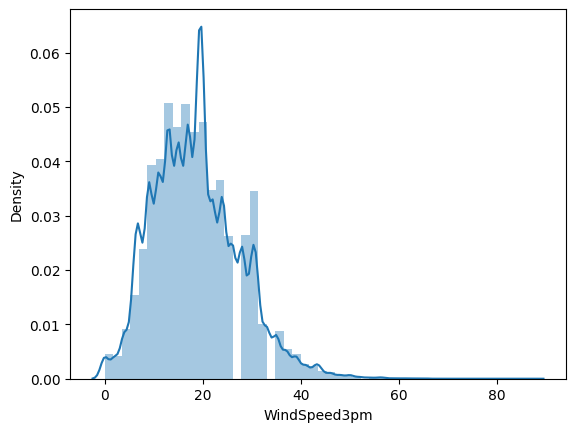

<Figure size 1500x1500 with 0 Axes>

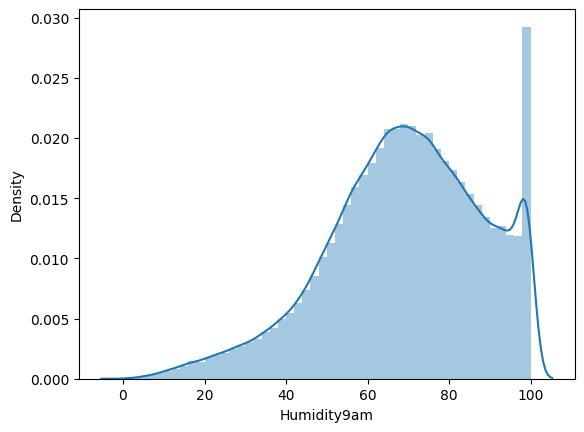

<Figure size 1500x1500 with 0 Axes>

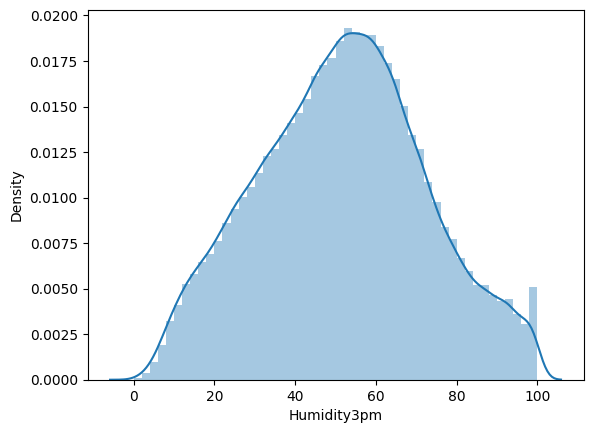

<Figure size 1500x1500 with 0 Axes>

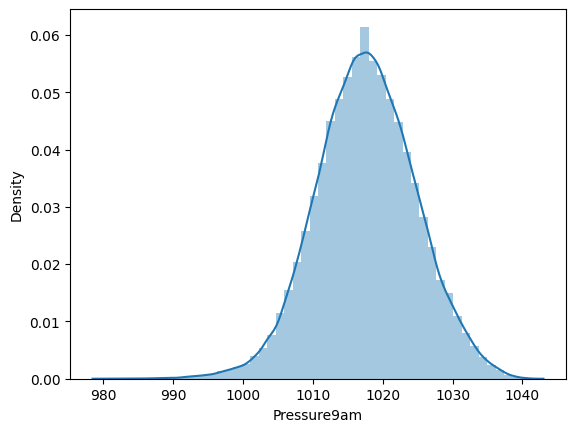

<Figure size 1500x1500 with 0 Axes>

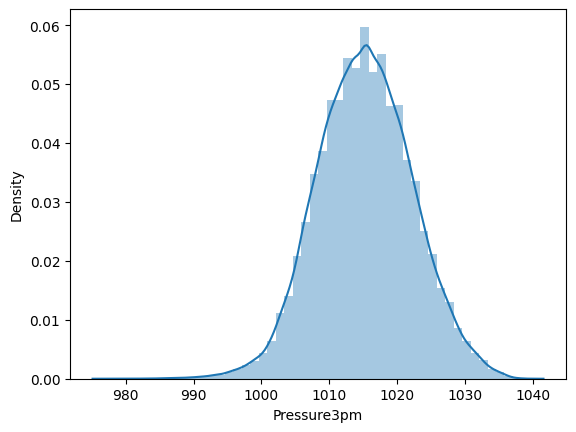

<Figure size 1500x1500 with 0 Axes>

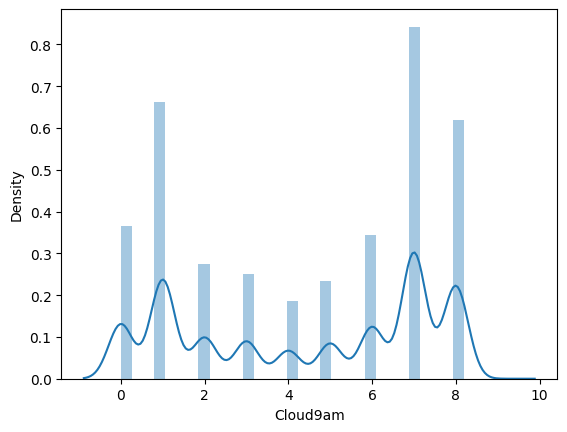

<Figure size 1500x1500 with 0 Axes>

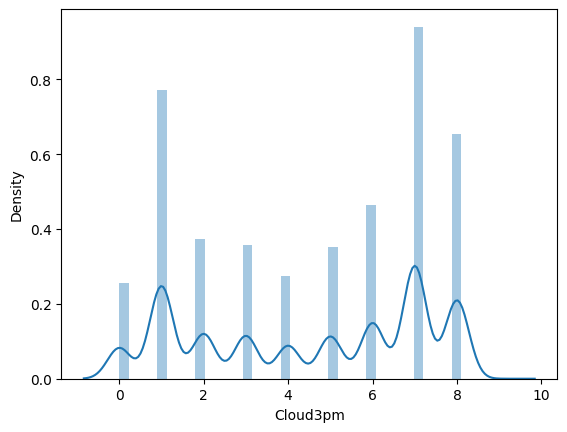

<Figure size 1500x1500 with 0 Axes>

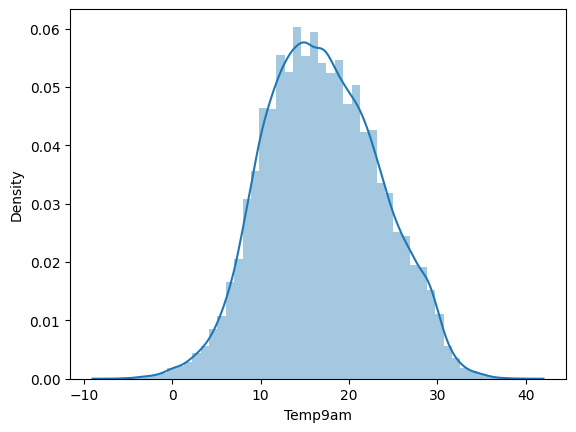

<Figure size 1500x1500 with 0 Axes>

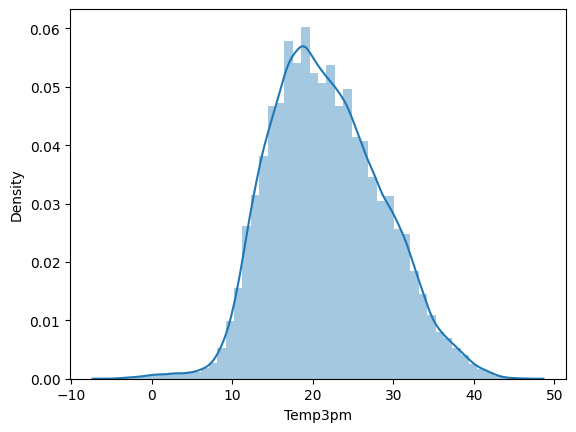

<Figure size 1500x1500 with 0 Axes>

In [ ]:
for feature in numerical:
  sns.distplot(df[feature])
  plt.figure(figsize=(15,15))
  plt.show()

### * Mintemp, Maxtemp, pressure3pm, pressure9am, Temp9am, Temp3am variables are almost normally distributed.

# Next we find unique locations and its name

In [ ]:
unique_loc=df['Location'].unique()
unique_loc

array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
       'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
       'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
       'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
       'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
       'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
       'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier', 'Nuriootpa',
       'Woomera', 'Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport',
       'Perth', 'SalmonGums', 'Walpole', 'Hobart', 'Launceston',
       'AliceSprings', 'Darwin', 'Katherine', 'Uluru'], dtype=object)

In [ ]:
print("unique number of locations are {}".format(len(unique_loc)))

unique number of locations are 49


# countplot for WindGustDir

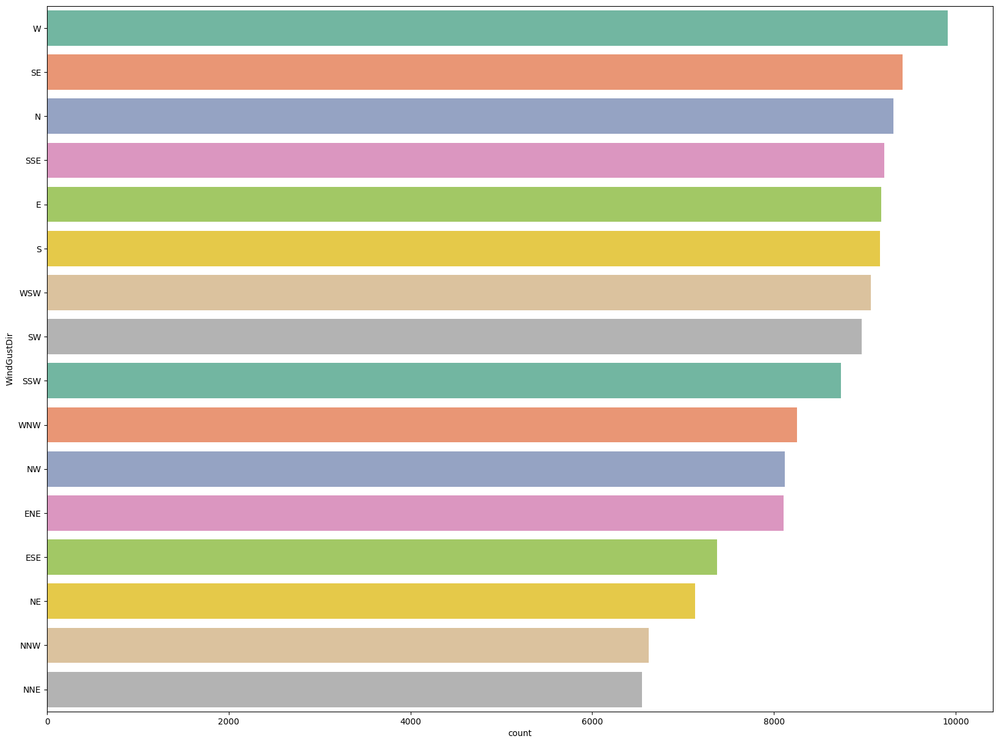

In [ ]:
plt.figure(figsize=(20,15))
sns.countplot(df['WindGustDir'],palette='Set2',order=df['WindGustDir'].value_counts().index)
plt.show()

# Wind direction at different timespan

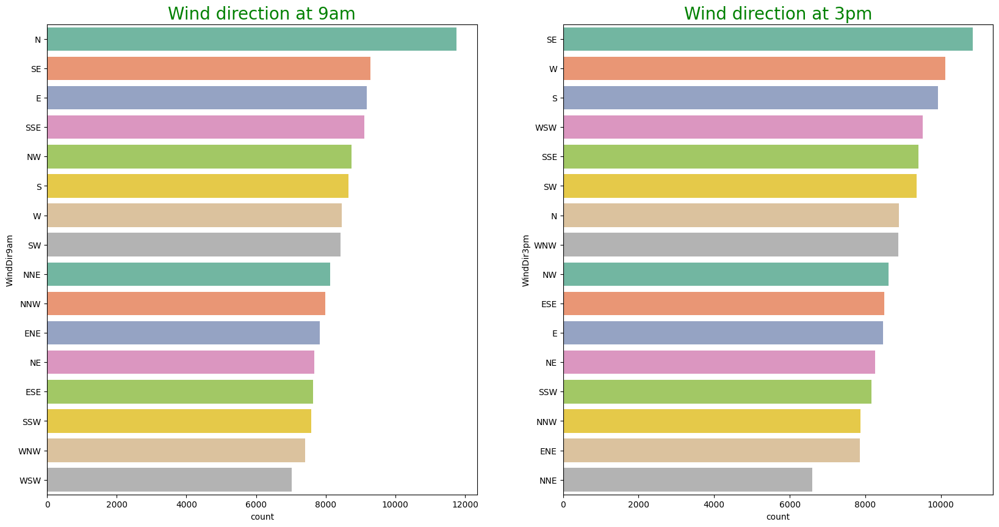

In [ ]:
plt.figure(figsize=(20,10))
wind9am=plt.subplot(1,2,1)
wind3pm=plt.subplot(1,2,2)
wind9am.set_title("Wind direction at 9am",size=20,color='g')
wind3pm.set_title("Wind direction at 3pm",size=20,color='g')
sns.countplot(df['WindDir9am'],palette='Set2',order=df['WindDir9am'].value_counts().index,ax=wind9am)
sns.countplot(df['WindDir3pm'],palette='Set2',order=df['WindDir3pm'].value_counts().index,ax=wind3pm)
plt.show()

### * At 9AM,direction of wind is more observed in North direction.  


### * At 3PM, direction of wind is more observed in South-East direction.

# Next we check the data is balanced or imbalanced

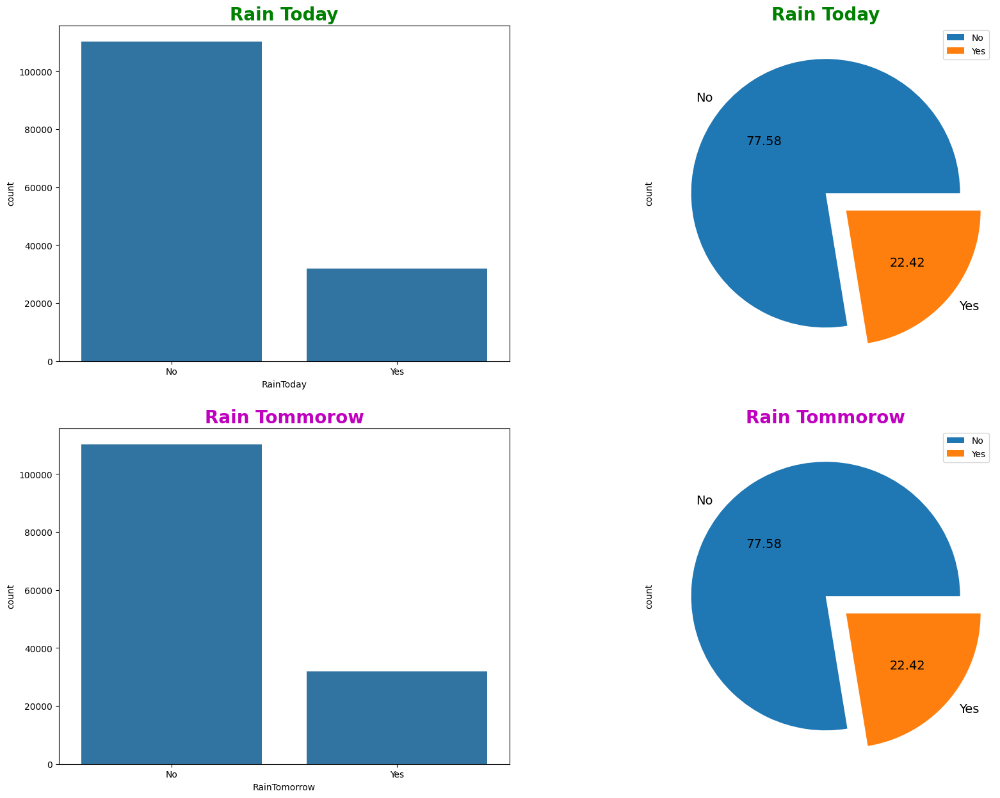

In [ ]:
plt.figure(figsize=(20,15))
ax1=plt.subplot(2,2,1)
plt.title("Rain Today",size=20,color='g',fontweight='bold')
sns.countplot(x='RainToday',data=df,ax=ax1)
ax2=plt.subplot(2,2,2)
plt.title("Rain Today",size=20,color='g',fontweight='bold')
df['RainToday'].value_counts().plot(kind='pie',ax=ax2,autopct='%0.2f',explode=[0,0.2],textprops={'fontsize':14,'color':'black'})
ax2.legend()
ax3=plt.subplot(2,2,3)
plt.title("Rain Tommorow",color='m',size=20,fontweight='bold')
sns.countplot(x='RainTomorrow',data=df,ax=ax3)
ax4=plt.subplot(2,2,4)
plt.title("Rain Tommorow",color='m',size=20,fontweight='bold')
df['RainTomorrow'].value_counts().plot(kind='pie',ax=ax4,autopct='%0.2f',explode=[0,0.2],textprops={'fontsize':14,'color':'black'})
ax4.legend()


# **Bivariate and Multivariate Analysis**

# Average rainfall based on year and month

Text(0, 0.5, 'Average rainfall')

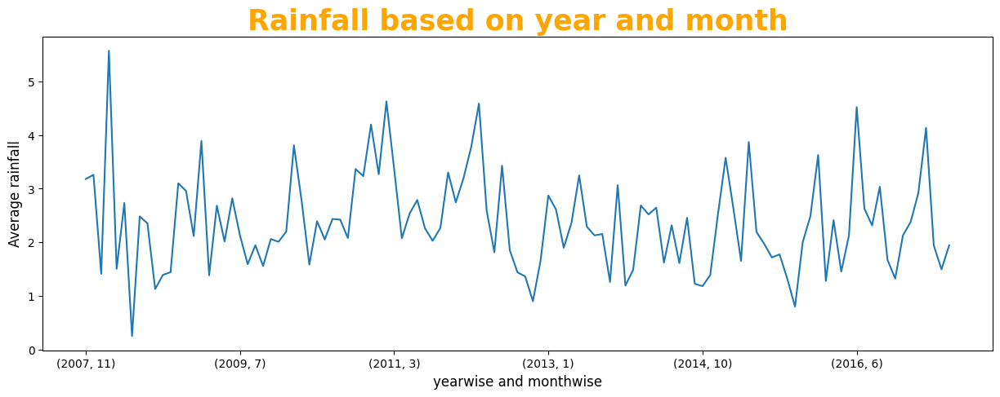

In [ ]:
plt.figure(figsize=(15,5))
df.groupby(by=['year','month'])['Rainfall'].mean().plot()
plt.title("Rainfall based on year and month",size=25,color='orange',fontweight='bold')
plt.xlabel("yearwise and monthwise",fontsize=12)
plt.ylabel("Average rainfall",fontsize=12)

In [ ]:
df.groupby(by=['year','month'])[['Rainfall']].mean().T


year      2007                2008                                          \
month       11        12        1         2         3         4         5    
Rainfall  3.18  3.258065  1.412903  5.568966  1.506452  2.733333  0.254839   

year                                                                  \
month           6         7         8         9         10        11   
Rainfall  2.483333  2.352893  1.130579  1.392437  1.445082  3.100418   

year                    2009                                          \
month           12        1         2         3         4         5    
Rainfall  2.958982  2.118521  3.888783  1.385261  2.683224  2.015823   

year                                                                           \
month           6         7         8        9         10        11        12   
Rainfall  2.820161  2.128984  1.593343  1.94503  1.558055  2.061933  2.010567   

year          2010                                                             \
month           1         2         3         4        5         6         7    
Rainfall  2.198292  3.807907  2.772023  1.585523  2.39476  2.053075  2.435533   

year                                                           2011            \
month           8        9         10        11        12        1         2    
Rainfall  2.423597  2.08028  3.365718  3.233406  4.193799  3.268688  4.626011   

year                                                                  \
month           3         5         6         7         8         9    
Rainfall  3.366007  2.075482  2.534396  2.788429  2.261216  2.027724   

year                                        2012                      \
month           10        11        12        1         2         3    
Rainfall  2.269936  3.301551  2.744705  3.196225  3.778931  4.584116   

year                                                                  \
month           4         5         6         7         8         9    
Rainfall  2.589933  1.815862  3.427259  1.854578  1.440523  1.366243   

year                              2013                                \
month           10        11        1         3         4         5    
Rainfall  0.904266  1.664015  2.872091  2.611111  1.899722  2.360622   

year                                                                         \
month           6         7         8         9         10        11     12   
Rainfall  3.246079  2.289973  2.129926  2.154934  1.263084  3.065551  1.196   

year          2014                                                            \
month           1         2         3         4        5         6        7    
Rainfall  1.486613  2.687082  2.520014  2.646078  1.62284  2.317157  1.61444   

year                                                           2015            \
month          8         9         10        11        12        1         2    
Rainfall  2.45776  1.227393  1.183949  1.389602  2.518057  3.574238  2.638357   

year                                                                  \
month           3         4         5         6         7         8    
Rainfall  1.654695  3.868856  2.194831  1.972406  1.718784  1.775813   

year                                                 2016                      \
month           9        10        11        12        1         2         3    
Rainfall  1.320668  0.80325  2.002756  2.491543  3.627379  1.280497  2.412355   

year                                                                           \
month          4         5         6         7         8         9         10   
Rainfall  1.45523  2.130698  4.518592  2.627465  2.314191  3.035131  1.672697   

year                             2017                                          \
month           11       12        1         2         3         4         5    
Rainfall  1.325279  2.12964  2.379396  2.920089  4.131174  1.943271  1.497472   

year                
month           6   
Rainfall  1.94463

# Maximum and minimum rainfall based on Year and Month

In [ ]:
grouped_data = df.groupby(by=['year', 'month'])[['Rainfall']].mean()
max_rainfall_month = grouped_data.idxmax()
max_rainfall_value = grouped_data.max()
min_rainfall_month = grouped_data.idxmin()
min_rainfall_value = grouped_data.min()
print("Maximum Rainfall Year and Monthwise:")
print("Year and Month is {}".format(max_rainfall_month.values[0]),"| Rainfall is {}".format(max_rainfall_value.values[0]))
print("\nMinimum Rainfall Year and Month-wise:")
print("Year and Month is {}".format(min_rainfall_month.values[0]), "| Rainfall is {}".format(min_rainfall_value.values[0]))

Maximum Rainfall Year and Monthwise:
Year and Month is (2008, 2) | Rainfall is 5.568965517241379

Minimum Rainfall Year and Month-wise:
Year and Month is (2008, 5) | Rainfall is 0.25483870967741934


# Rainfall based on Month and Day

Text(0, 0.5, 'Average Rainfall')

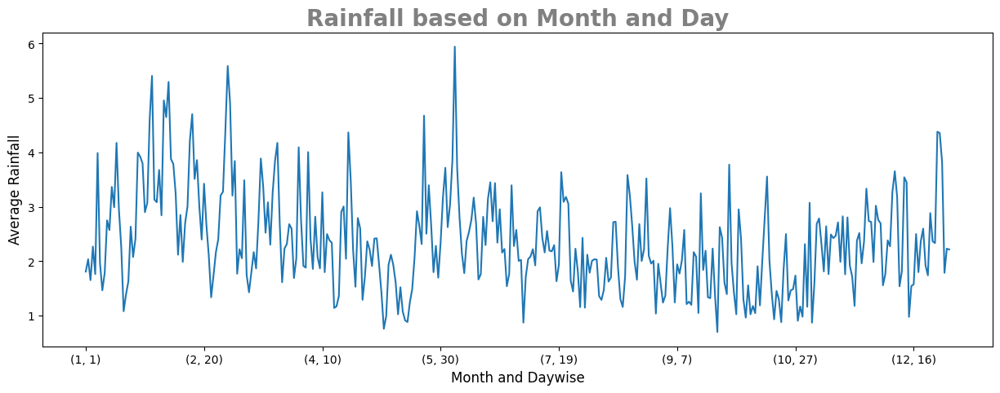

In [ ]:
plt.figure(figsize=(15,5))
df.groupby(by=['month','day'])['Rainfall'].mean().plot()
plt.title("Rainfall based on Month and Day",size=20,fontweight='bold',color='grey')
plt.xlabel("Month and Daywise",fontsize=12)
plt.ylabel("Average Rainfall",fontsize=12)


# Maximum and Minimum rainfall based on Month and Day

In [ ]:
max_month=df.groupby(by=['month'])['Rainfall'].mean().sort_values(ascending=False).idxmax()
max_day=df.groupby(by=['day'])['Rainfall'].mean().sort_values(ascending=False).idxmax()
min_month=df.groupby(by=['month'])['Rainfall'].mean().sort_values().idxmin()
min_day=df.groupby(by=['day'])['Rainfall'].mean().sort_values().idxmin()
print("In {} month".format(max_month),"and day {}".format(max_day),"have highest rainfall")
print ("In {} month".format(min_month),"and day {}".format(min_day),"have minimum rainfall")

In 2 month and day 31 have highest rainfall
In 10 month and day 9 have minimum rainfall


# Average rainfall based on Location

Text(0.5, 0, 'Location')

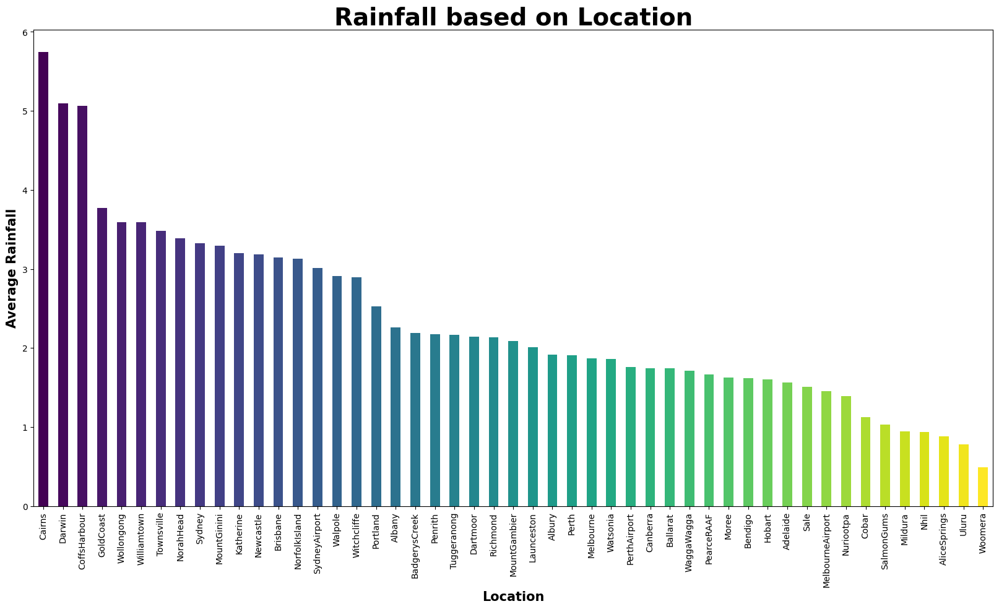

In [ ]:
plt.figure(figsize=(20,10))
df.groupby(by=['Location'])['Rainfall'].mean().sort_values(ascending=False).plot(kind='bar',color=plt.cm.viridis(np.linspace(0,1,len(df['Location'].unique()))))
plt.title('Rainfall based on Location',fontsize=28,fontweight='bold')
plt.ylabel('Average Rainfall',fontsize=15,fontweight='bold')
plt.xlabel('Location',fontsize=15,fontweight='bold')

In [ ]:
max=df.groupby(by=['Location'])['Rainfall'].mean().sort_values(ascending=False).idxmax()
min=df.groupby(by=['Location'])['Rainfall'].mean().sort_values().idxmin()
print("Location {} have maximum rainfall.".format(max))
print("Location {} have minimum rainfall".format(min))

Location Cairns have maximum rainfall.
Location Woomera have minimum rainfall


# Next we find the relationship between variables using scatter plot

<Axes: title={'center': 'Wind direction at 9am and 3pm'}, xlabel='WindDir9am', ylabel='WindDir3pm'>

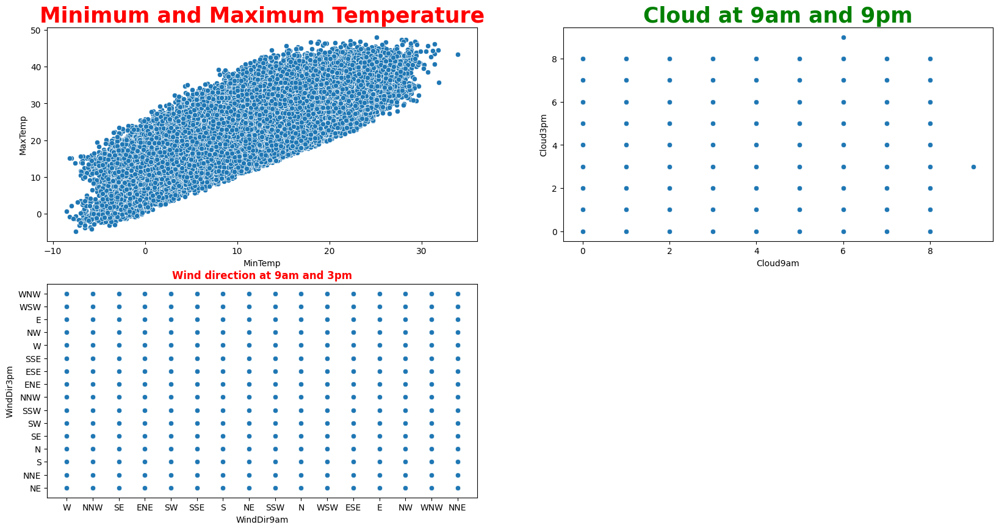

In [ ]:
plt.figure(figsize=(20,10))
ax1=plt.subplot(2,2,1)
plt.title("Minimum and Maximum Temperature",fontweight='bold',color='red',size=25)
sns.scatterplot(data=df, x='MinTemp',y='MaxTemp')
ax2=plt.subplot(2,2,2)
plt.title("Cloud at 9am and 9pm",fontweight='bold',size=25,color='green')
sns.scatterplot(data=df,x='Cloud9am',y='Cloud3pm')
ax3=plt.subplot(2,2,3)
plt.title("Wind direction at 9am and 3pm",fontweight='bold',color='red')
sns.scatterplot(data=df,x='WindDir9am',y='WindDir3pm')

<Axes: title={'center': 'Windspeed at 9am and 3pm'}, xlabel='WindSpeed9am', ylabel='WindSpeed3pm'>

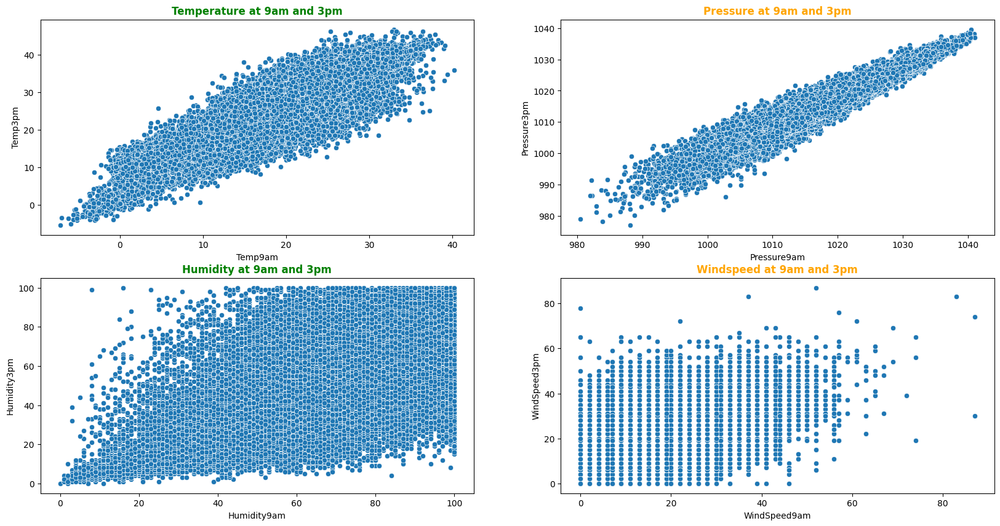

In [ ]:
plt.figure(figsize=(20,10))
ax1=plt.subplot(2,2,1)
plt.title("Temperature at 9am and 3pm",fontweight='bold',color='green')
sns.scatterplot(data=df,x='Temp9am',y='Temp3pm')
ax2=plt.subplot(2,2,2)
plt.title("Pressure at 9am and 3pm",fontweight='bold',color='orange')
sns.scatterplot(data=df,x='Pressure9am',y='Pressure3pm')
ax3=plt.subplot(2,2,3)
plt.title("Humidity at 9am and 3pm",fontweight='bold',color='green')
sns.scatterplot(data=df,x='Humidity9am',y='Humidity3pm')
ax4=plt.subplot(2,2,4)
plt.title("Windspeed at 9am and 3pm",fontweight='bold',color='orange')
sns.scatterplot(data=df,x='WindSpeed9am',y='WindSpeed3pm')

 * Both temperature and pressure shows linear relationship and other variables doesnot showing linear realationship  

<Axes: title={'center': 'Sunshine v/s Rainfall'}, xlabel='Sunshine', ylabel='Rainfall'>

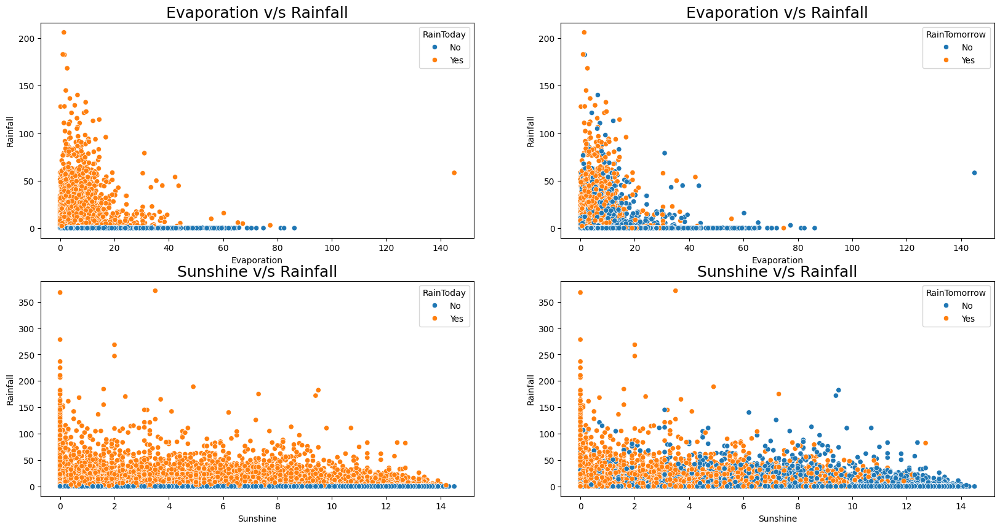

In [ ]:
plt.figure(figsize=(20,10))
ax1=plt.subplot(2,2,1)
plt.title('Evaporation v/s Rainfall',fontsize=18)
sns.scatterplot(data=df,x='Evaporation',y='Rainfall',ax=ax1,hue='RainToday')
ax2=plt.subplot(2,2,2)
plt.title('Evaporation v/s Rainfall',fontsize=18)
sns.scatterplot(data=df,x='Evaporation',y='Rainfall',ax=ax2,hue='RainTomorrow')
ax3=plt.subplot(2, 2, 3)
plt.title('Sunshine v/s Rainfall', fontsize=18)
sns.scatterplot(data=df,x='Sunshine',y='Rainfall',ax=ax3,hue='RainToday')
ax4=plt.subplot(2,2,4)
plt.title('Sunshine v/s Rainfall',fontsize=18)
sns.scatterplot(data=df,x='Sunshine',y='Rainfall',ax=ax4,hue='RainTomorrow')

* **As Evaporation increases, chances of rainfall happening is very less**

* **As Sunshine increases, chances of rainfall is there but rainfall rate is less**

# Average rainfall based on wind direction

<Axes: xlabel='WindGustDir'>

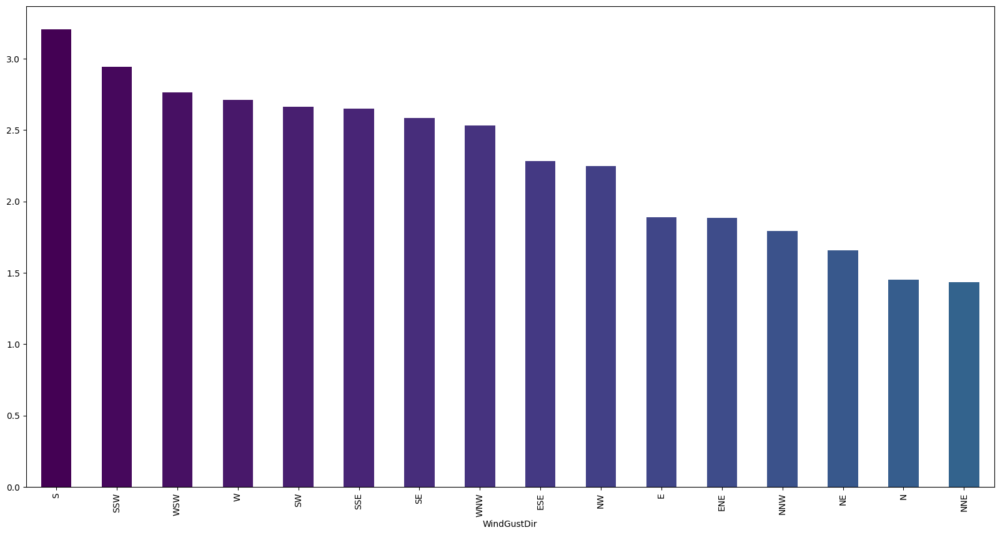

In [ ]:
plt.figure(figsize=(20,10))
color=color=plt.cm.viridis(np.linspace(0,1,len(df['Location'].unique())))
df.groupby(by=['WindGustDir'])['Rainfall'].mean().sort_values(ascending=False).plot(kind='bar',color=color)

### * **In south direction rainfall is more**

# Relation between all variables

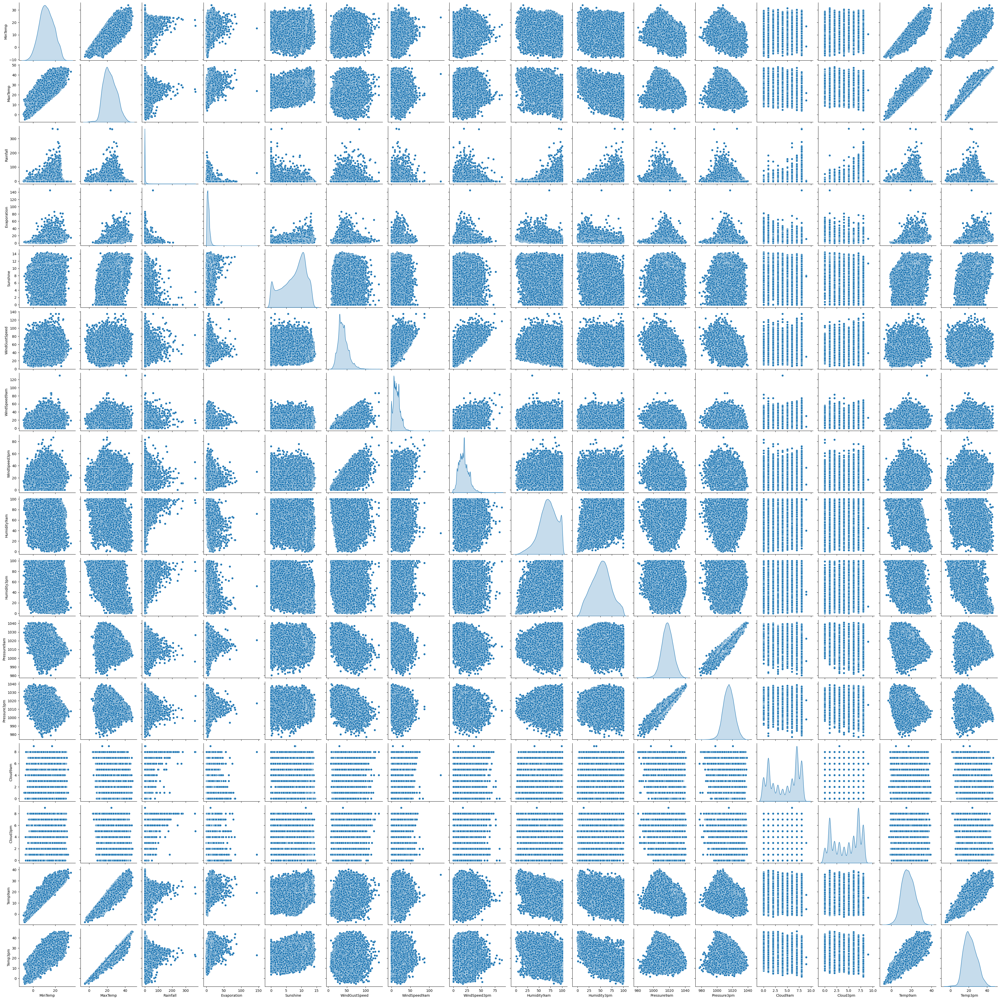

In [ ]:
sns.pairplot((df.drop(columns=['day','month','year'],axis=1)),diag_kind='kde')

### * **Few variables are normally distributed and shows linear relationship with other variables**

# **Data preprocessing**

## Dropping duplicate rows

In [ ]:
df.drop_duplicates(inplace=True)
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,2017,6,21
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,2017,6,22
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,2017,6,23
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No,2017,6,24


# Removing Date feature because it is converted into day,month and year column

In [ ]:
df.drop('Date',axis=1,inplace=True)

In [ ]:
# Convert categorical column into numrical (RainToday, RainTomorrow)
df['RainToday'] = df['RainToday'].replace({'No':0, 'Yes':1})
df['RainTomorrow'] = df['RainTomorrow'].replace({'No':0, 'Yes':1})

In [ ]:
categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
for i in categorical_columns:
  df[i].fillna(df[i].mode()[0],inplace=True)

In [ ]:
columns=['WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Cloud9am','Cloud3pm']
for i in columns:
  df[i].fillna(df[i].median(),inplace=True)

In [ ]:
df.dropna(subset=['RainToday'],inplace=True)

In [ ]:
df.dropna(subset=['RainTomorrow'],inplace=True)

In [ ]:
numerical_columns=df.select_dtypes(include='number').columns
column_means=df[numerical_columns].mean()
df[numerical_columns]=df[numerical_columns].fillna(column_means)

In [ ]:
df.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
year             0
month            0
day              0
dtype: int64

## converting categorical feature into numerical feature using label encoding

In [ ]:
le=LabelEncoder()
df['Location']=le.fit_transform(df['Location']).astype('int32')
df['WindGustDir']=le.fit_transform(df['WindGustDir']).astype('int32')
df['WindDir9am']=le.fit_transform(df['WindDir9am']).astype('int32')
df['WindDir3pm']=le.fit_transform(df['WindDir3pm']).astype('int32')

In [ ]:
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,2,13.4,22.9,0.6,5.472516,7.63054,13,44.0,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,0.0,0.0,2008,12,1
1,2,7.4,25.1,0.0,5.472516,7.63054,14,44.0,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,0.0,0.0,2008,12,2
2,2,12.9,25.7,0.0,5.472516,7.63054,15,46.0,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,0.0,0.0,2008,12,3
3,2,9.2,28.0,0.0,5.472516,7.63054,4,24.0,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,0.0,0.0,2008,12,4
4,2,17.5,32.3,1.0,5.472516,7.63054,13,41.0,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,0.0,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,41,3.5,21.8,0.0,5.472516,7.63054,0,31.0,2,0,15.0,13.0,59.0,27.0,1024.7,1021.2,5.0,5.0,9.4,20.9,0.0,0.0,2017,6,20
145455,41,2.8,23.4,0.0,5.472516,7.63054,0,31.0,9,1,13.0,11.0,51.0,24.0,1024.6,1020.3,5.0,5.0,10.1,22.4,0.0,0.0,2017,6,21
145456,41,3.6,25.3,0.0,5.472516,7.63054,6,22.0,9,3,13.0,9.0,56.0,21.0,1023.5,1019.1,5.0,5.0,10.9,24.5,0.0,0.0,2017,6,22
145457,41,5.4,26.9,0.0,5.472516,7.63054,3,37.0,9,14,9.0,9.0,53.0,24.0,1021.0,1016.8,5.0,5.0,12.5,26.1,0.0,0.0,2017,6,23


## Next our aim is to find outliers

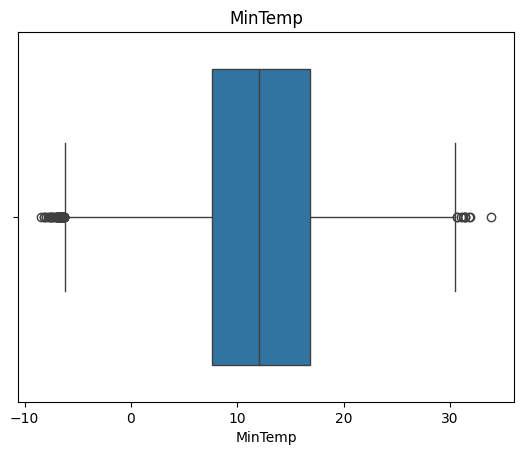

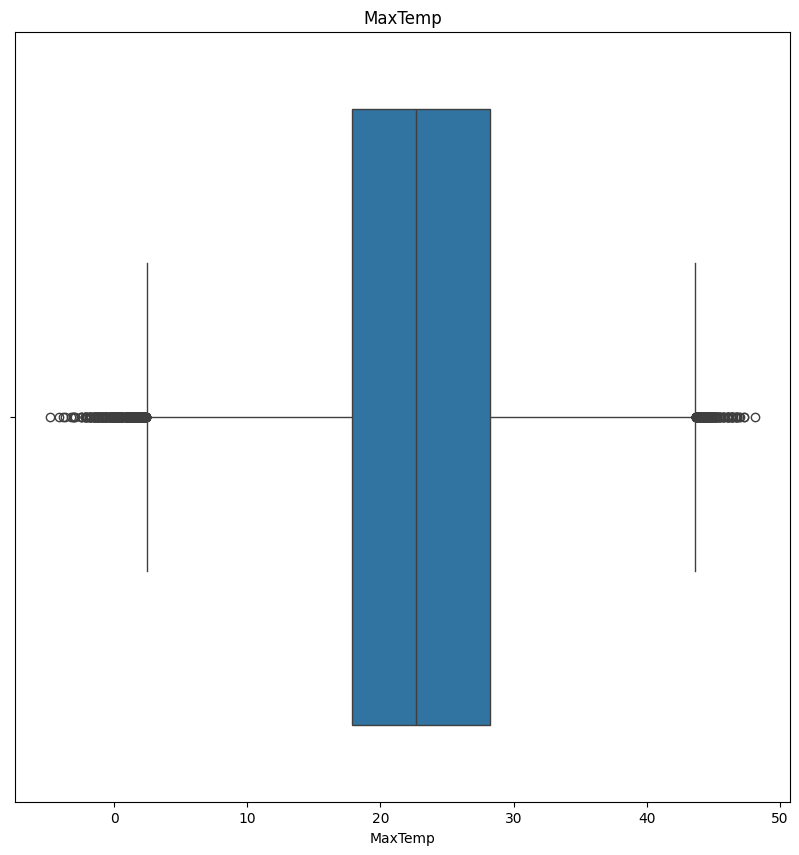

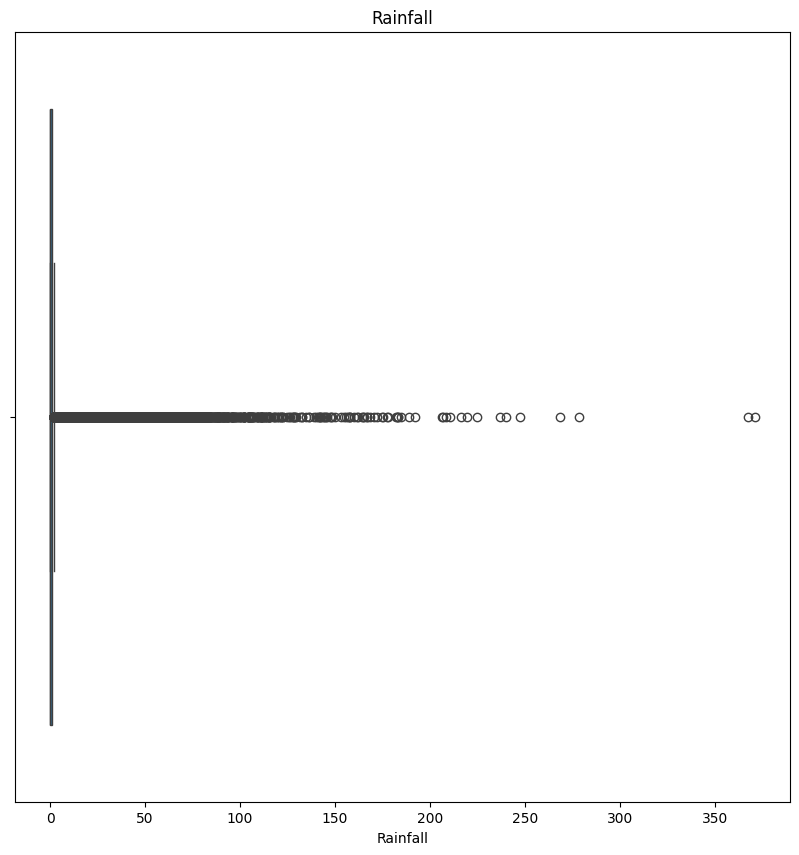

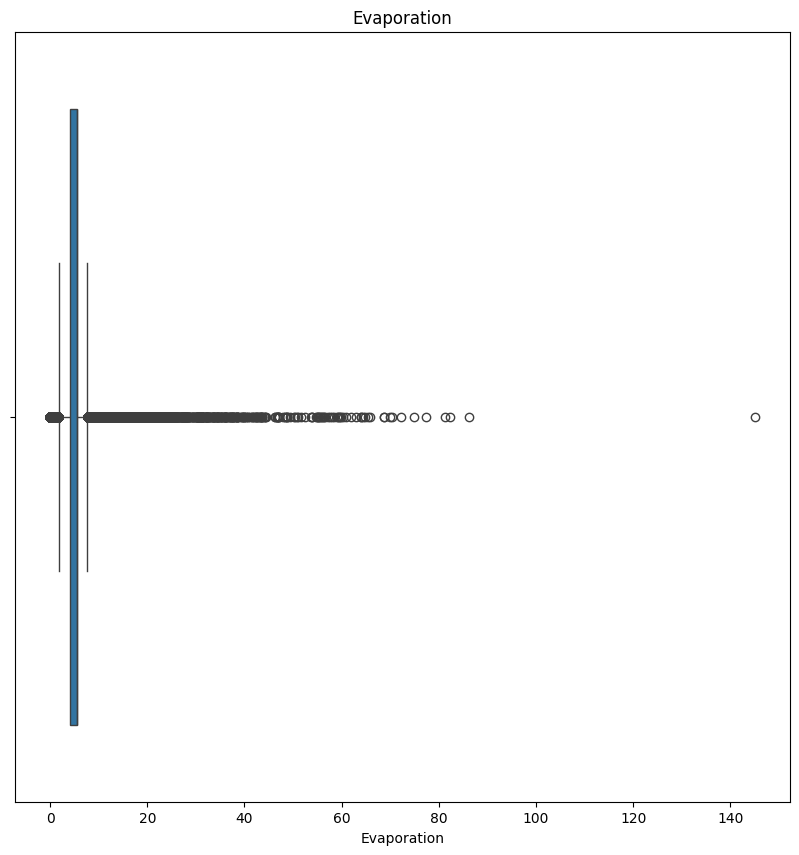

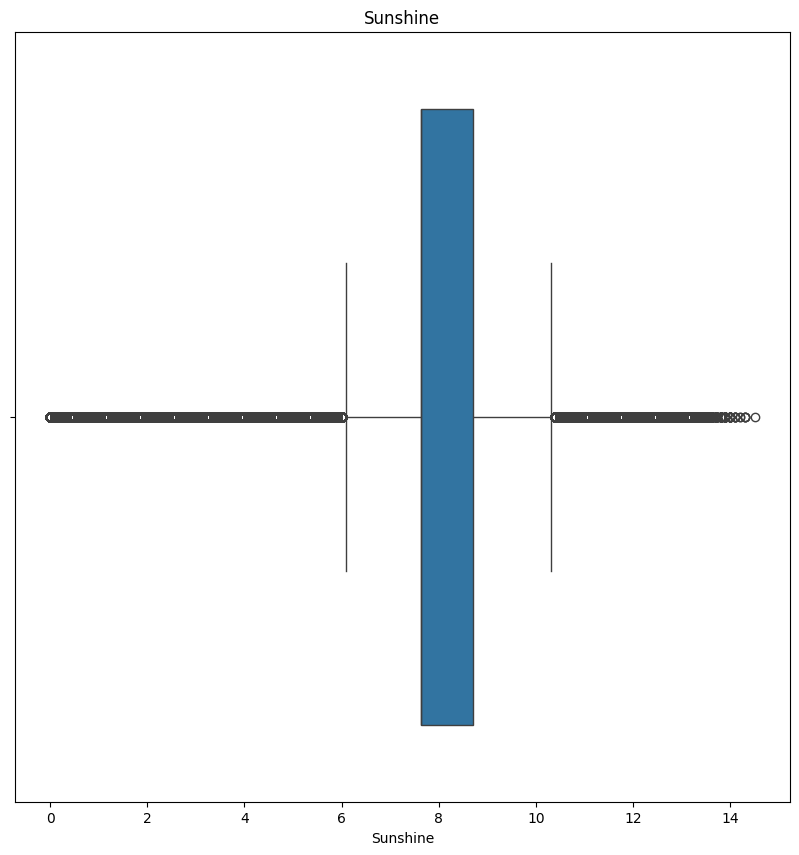

...

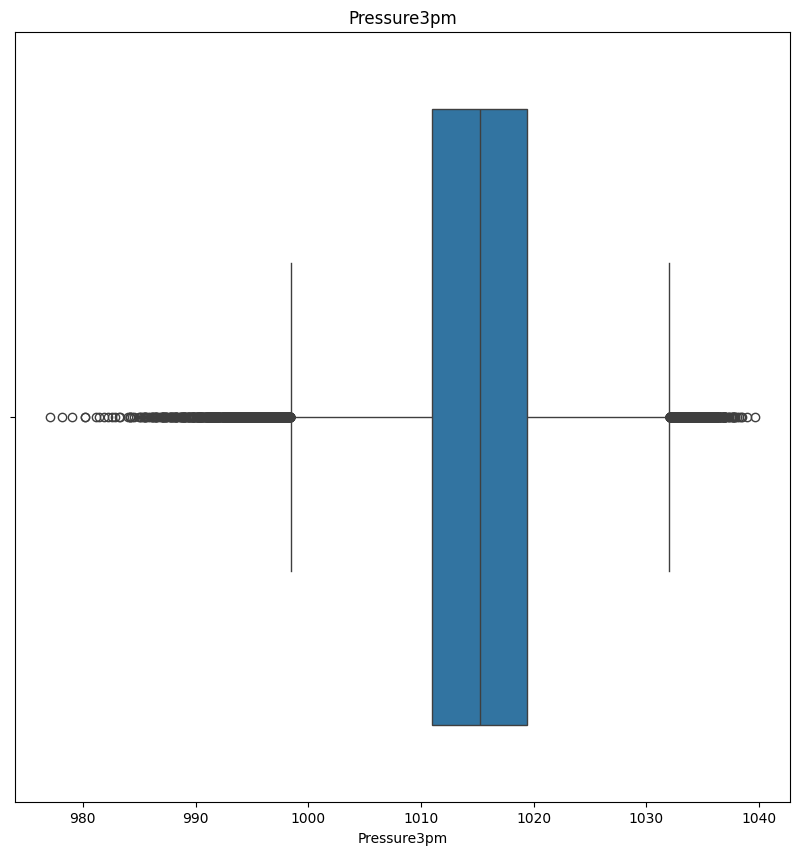

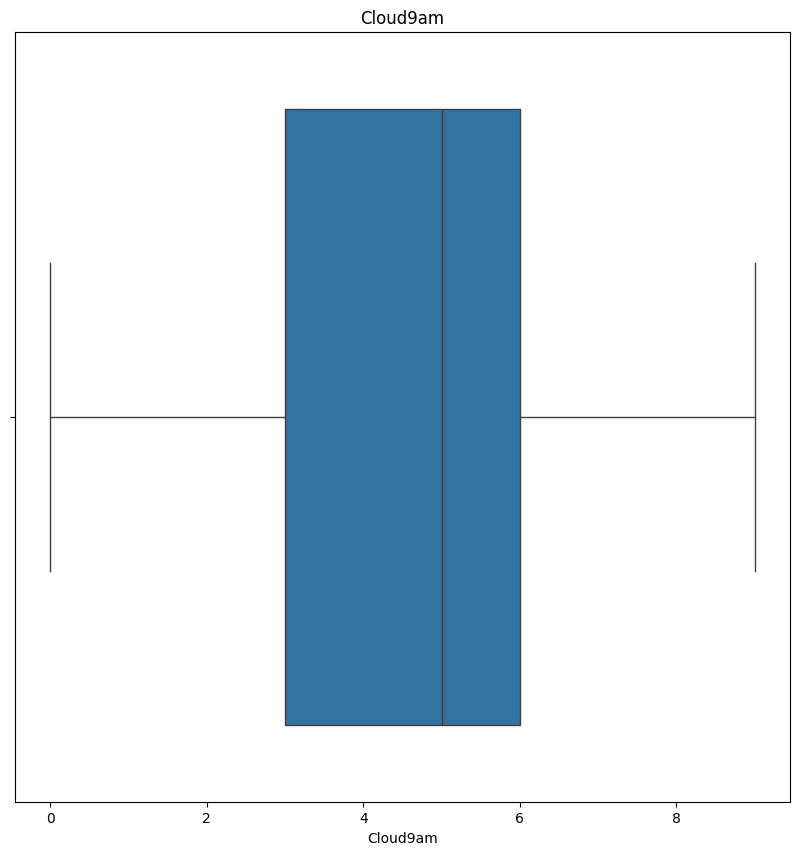

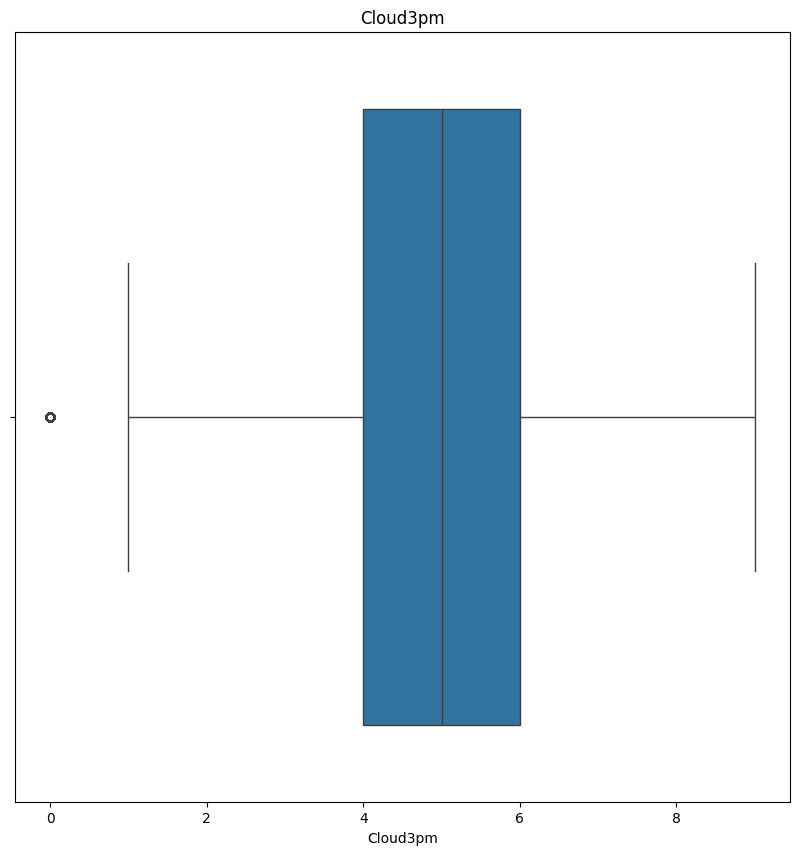

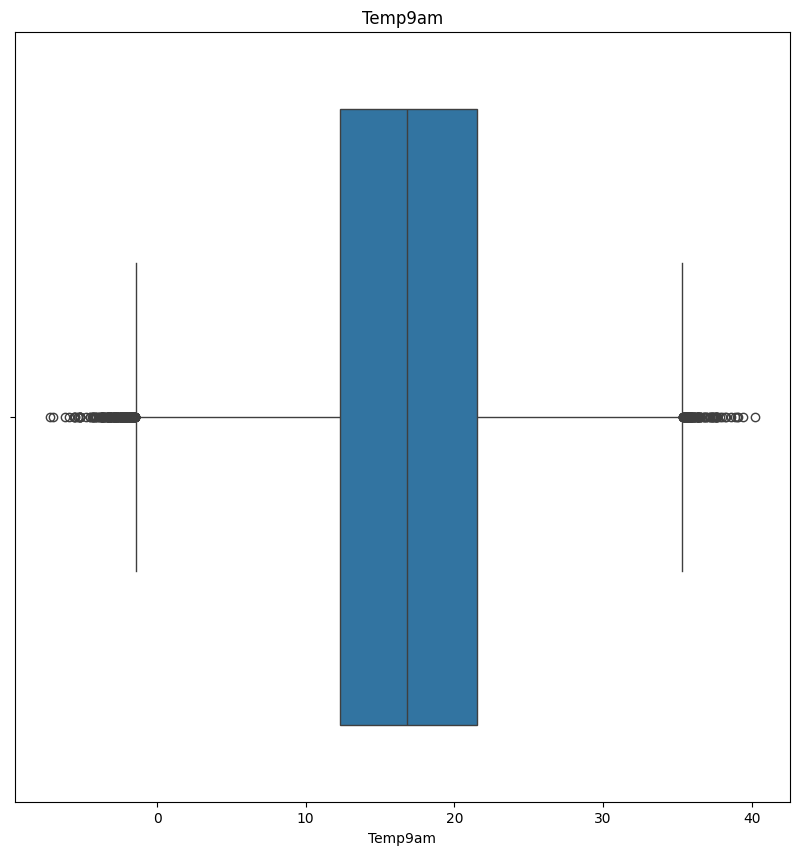

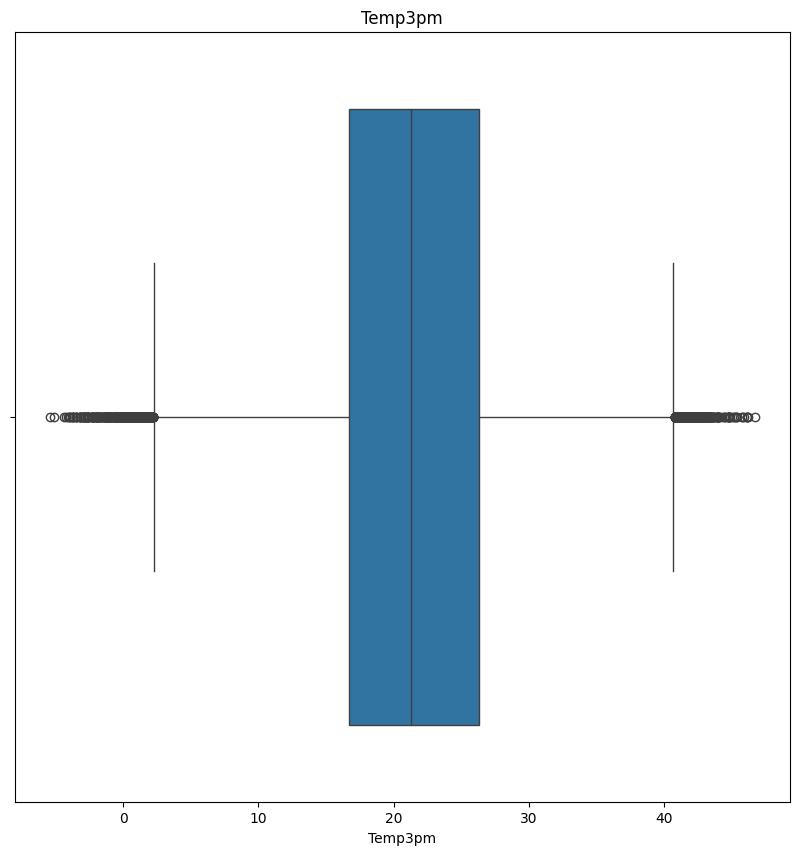

<Figure size 1000x1000 with 0 Axes>

In [ ]:
for feature in numerical:
  sns.boxplot(df[feature],orient='h')
  plt.title(feature)
  plt.figure(figsize=(10,10))


# Handling outliers

In [ ]:
for column in numerical:
    q1=df[column].quantile(0.25)
    q3=df[column].quantile(0.75)
    iqr=q3-q1
    lower_bound=q1-(iqr*1.5)
    upper_bound=q3+(iqr*1.5)
    df.loc[df[column]>=upper_bound,column]=upper_bound
    df.loc[df[column]<=lower_bound,column]=lower_bound

## Boxplot after removing outliers

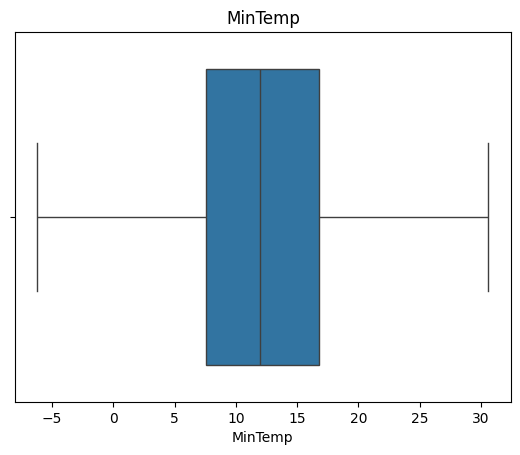

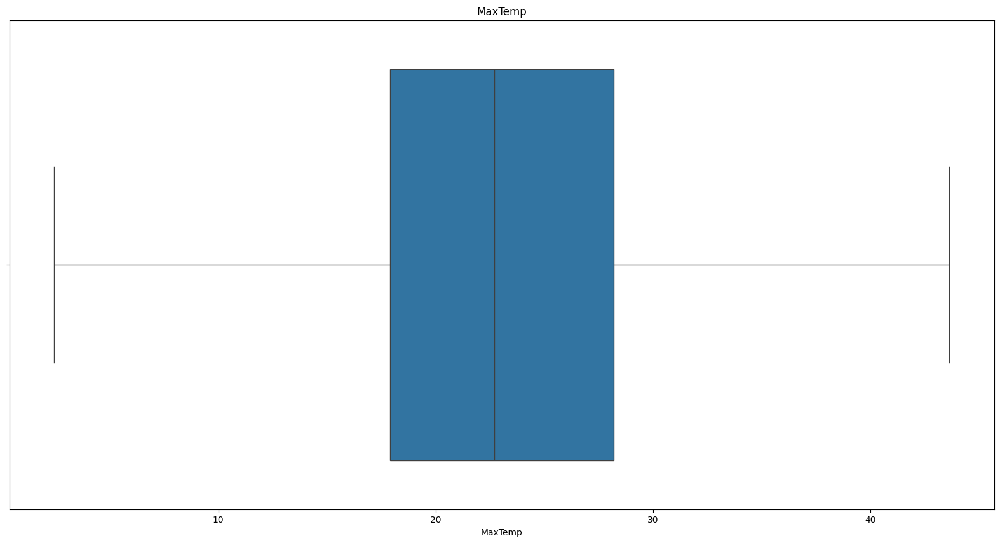

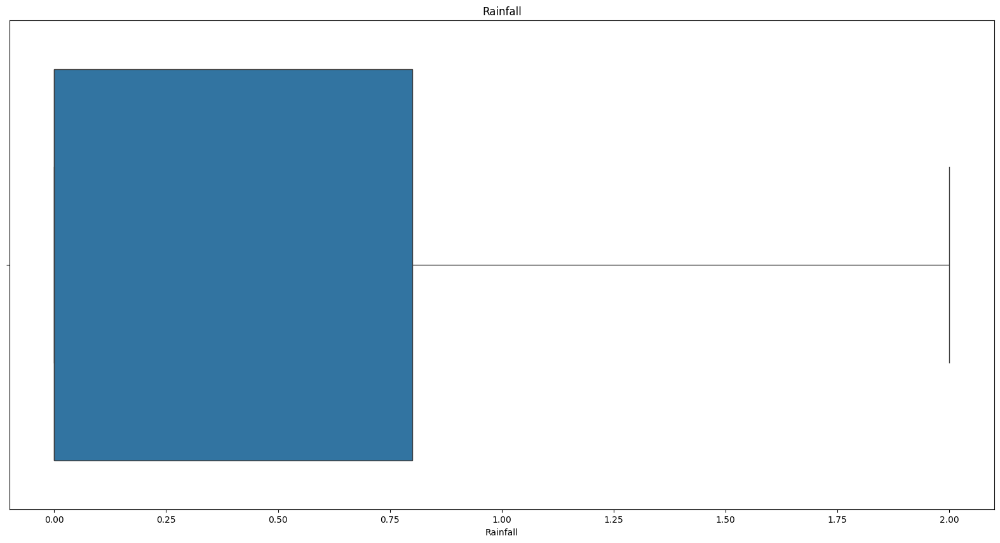

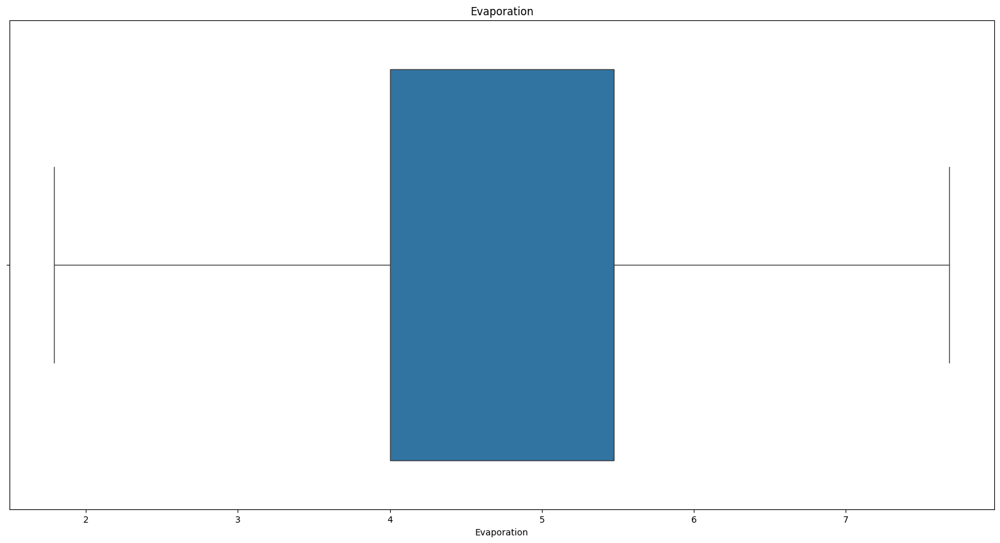

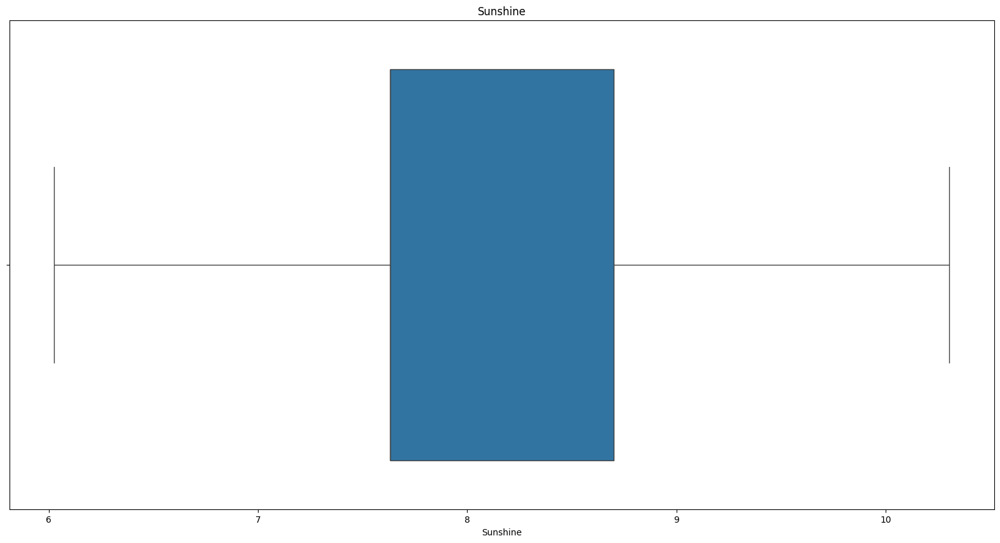

...

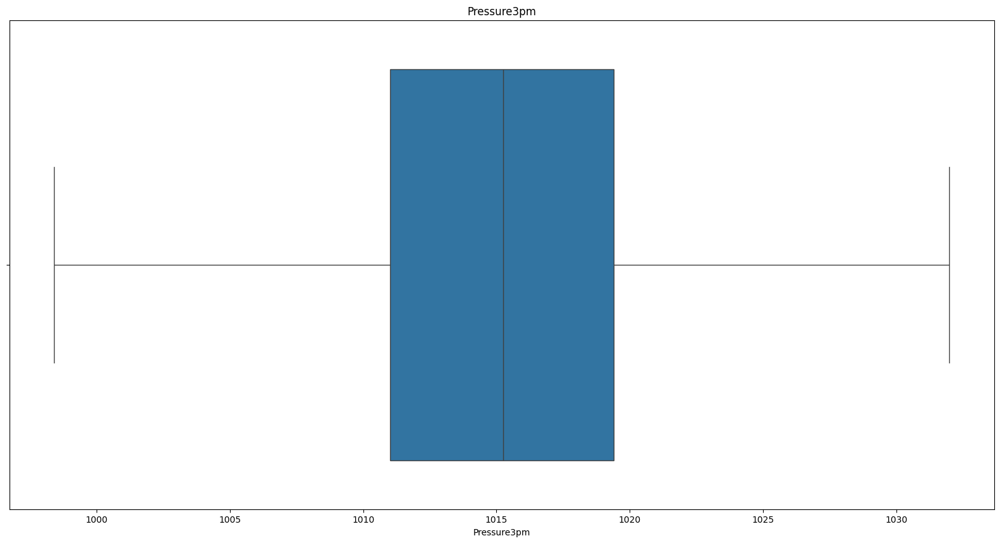

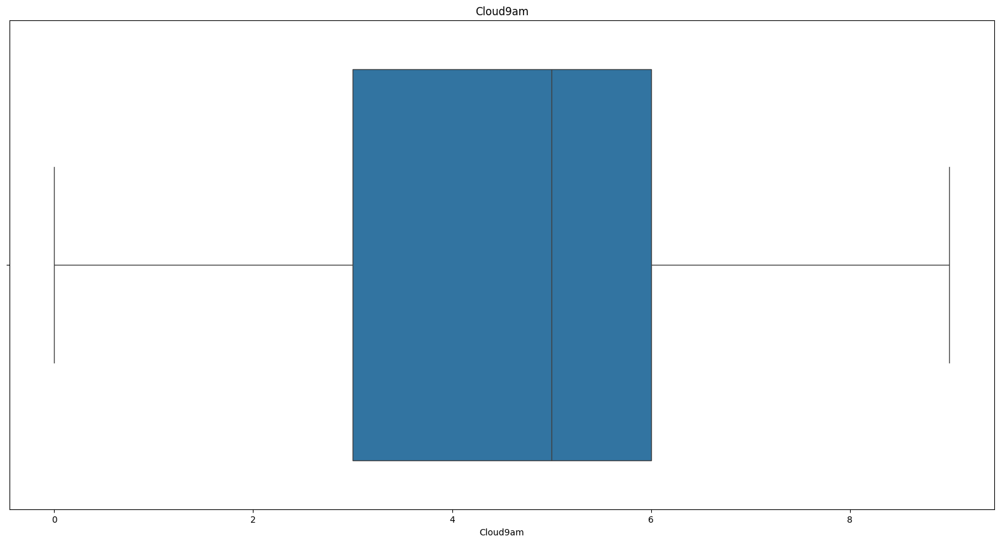

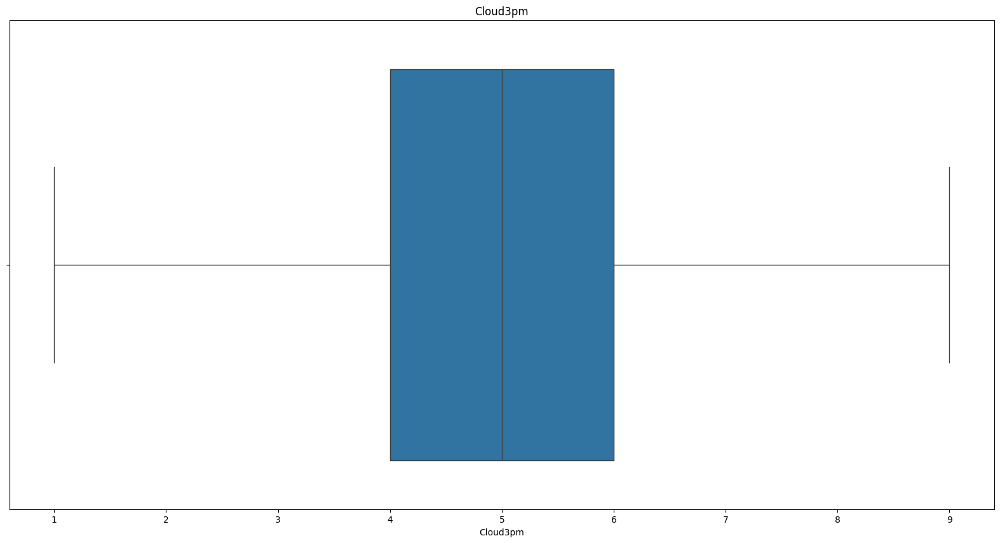

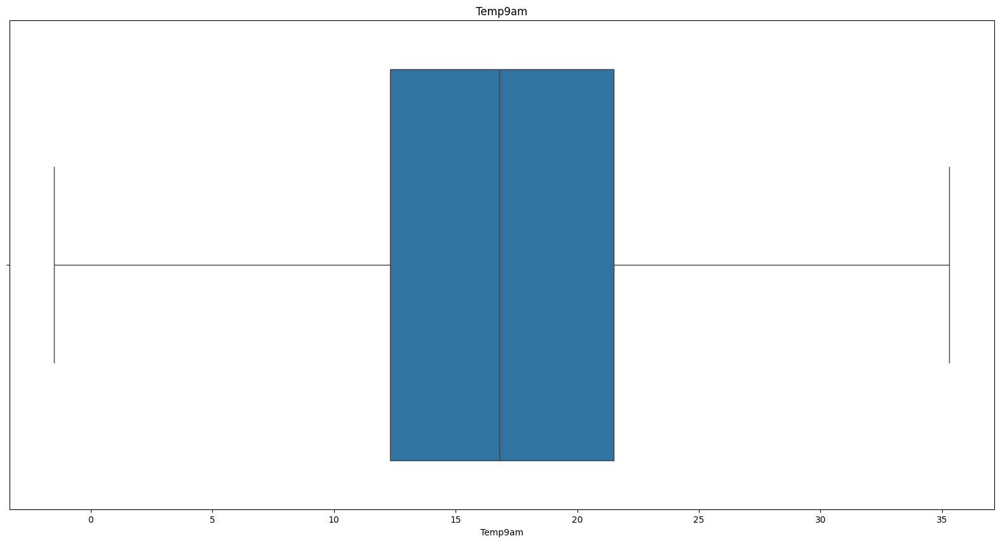

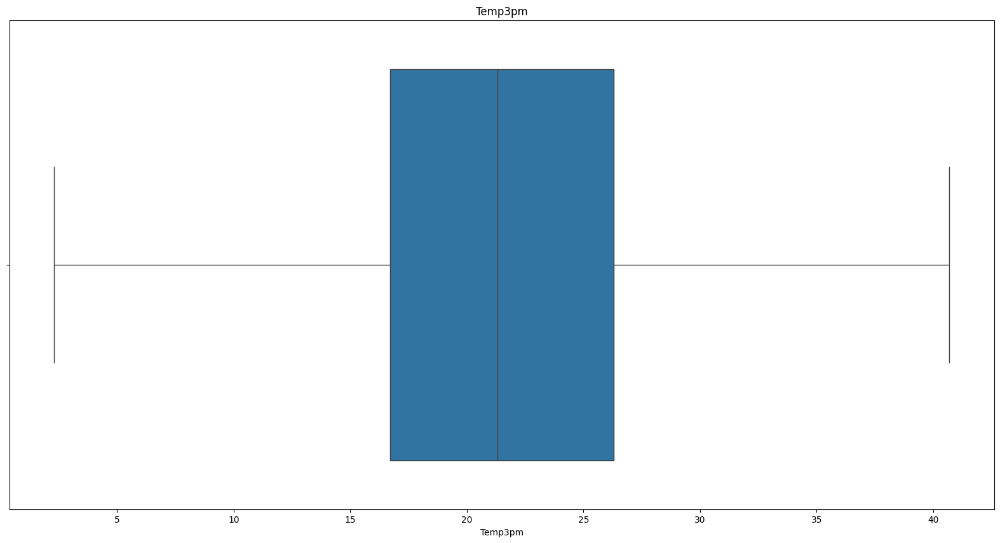

<Figure size 2000x1000 with 0 Axes>

In [ ]:
for feature in numerical:
  sns.boxplot(df[feature],orient='h')
  plt.title(feature)
  plt.figure(figsize=(20,10))


In [ ]:
df.drop(['RainToday'],axis=1,inplace=True)

# **seperating x and y**

In [ ]:
x=df.drop(['RainTomorrow'],axis=1).values
x.shape

(140787, 23)

In [ ]:
y=df['RainTomorrow'].values
y.shape

(140787,)

# **Implementing undersampling for handling imbalanced data**

In [ ]:
nm=NearMiss()
x_res,y_res=nm.fit_resample(x,y)

In [ ]:
x_res.shape,y_res.shape

((62402, 23), (62402,))

In [ ]:
print('original dataset shape {}'.format(Counter(y)))
print('Resampled dataset shape {}'.format(Counter(y_res)))

original dataset shape Counter({0.0: 109586, 1.0: 31201})
Resampled dataset shape Counter({0.0: 31201, 1.0: 31201})


# **Splitting the data into training and testing**

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(x_res,y_res,test_size=0.30,random_state=42)
x_train

array([[  14. ,   10.4,   22.7, ..., 2009. ,    6. ,   14. ],
       [  27. ,   16.2,   20. , ..., 2016. ,   10. ,   13. ],
       [  20. ,    4.9,   19.4, ..., 2012. ,    5. ,    6. ],
       ...,
       [   8. ,   22.9,   31.6, ..., 2013. ,   10. ,   19. ],
       [   8. ,   22.3,   29.8, ..., 2011. ,    8. ,   28. ],
       [  46. ,    7.3,   24.8, ..., 2017. ,    5. ,    3. ]])

In [ ]:
x_test

array([[  34. ,   11.7,   23.8, ..., 2017. ,    5. ,   23. ],
       [   8. ,   22.2,   28.7, ..., 2017. ,    5. ,   31. ],
       [  18. ,   27. ,   33.5, ..., 2016. ,   12. ,   29. ],
       ...,
       [  13. ,   23.7,   33.7, ..., 2014. ,    5. ,   26. ],
       [  43. ,   12. ,   15.6, ..., 2015. ,    5. ,   18. ],
       [  24. ,   16.2,   23.7, ..., 2010. ,   11. ,   18. ]])

In [ ]:
y_train

array([0., 1., 0., ..., 0., 0., 1.])

In [ ]:
y_test

array([0., 0., 1., ..., 0., 1., 0.])

# **Normalization**

In [ ]:
scaler=MinMaxScaler()
x_train_normalized=scaler.fit_transform(x_train)
x_test_normalized=scaler.fit_transform(x_test)

# **Next we perform Hyper parameter tuning**

In [ ]:
classifiers={"Random Forest":(RandomForestClassifier(),{'n_estimators':[50,100,200],'max_depth':[None,10,20],'min_samples_split':[2,5,10],'min_samples_leaf':[1,2,4]}),
"KNN":(KNeighborsClassifier(),{'n_neighbors':[3,5,7],'weights':['uniform','distance'],'metric':['euclidean','manhattan']}),
"SVM":(SVC(), {'C':[0.1,1,10],'kernel':['linear','rbf'],'gamma':['scale','auto']}),
"Logistic Regression":(LogisticRegression(),{'C': [0.1,1,10], 'solver':['liblinear','lbfgs']}),
"Decision Tree":(DecisionTreeClassifier(),{'max_depth': [None, 10, 20],'min_samples_split':[2,5,10],'min_samples_leaf':[1,2,4]}),
"Gradient Boosting":(GradientBoostingClassifier(),{'n_estimators':[50,100,200],'learning_rate': [0.05,0.1,0.2],'max_depth':[3,5,7]})}

In [ ]:
for name,(classifier,param_grid) in classifiers.items():
    print(f"\n{80*'-'}\n{name}:\n")
    grid_search=GridSearchCV(estimator=classifier,param_grid=param_grid,cv=5,n_jobs=1,verbose=2)
    grid_search.fit(x_train_normalized,y_train)
    best_params=grid_search.best_params_
    best_model=grid_search.best_estimator_
    y_pred=best_model.predict(x_test_normalized)
    accuracy=accuracy_score(y_test,y_pred)
    print("Best parameters {}".format(best_params))
    print("Accuracy {}".format(accuracy))

# **Training machine learning model and performance Evaluvatio**n

In [ ]:
random_forest_model=RandomForestClassifier(max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200)
knn_model=KNeighborsClassifier(metric='manhattan', n_neighbors=7, weights='distance')
svc_model=SVC(C=1, gamma='scale', kernel='rbf')
logistic_model=LogisticRegression(C=10, solver='liblinear')
decisiontree_model=DecisionTreeClassifier(max_depth=10, min_samples_leaf=1, min_samples_split=2)
gradient_model=GradientBoostingClassifier(learning_rate=0.1, max_depth=7, n_estimators=200)

In [ ]:
all_models=[knn_model,svc_model,logistic_model,decisiontree_model,random_forest_model,gradient_model]
for i in all_models:
  print("Model name is {}".format(i))
  i.fit(x_train_normalized,y_train)
  y_pred=i.predict(x_test_normalized)
  print("//"*280)
  print(confusion_matrix(y_test,y_pred))
  print(classification_report(y_test,y_pred))

Model name is KNeighborsClassifier(metric='manhattan', n_neighbors=7, weights='distance')
////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////
[[5058 1118]
 [2263 4042]]
              precision    recall  f1-score   support

         0.0       0.69      0.82      0.75      6176
         1.0       0.78      0.64      0.71      6305

    accuracy                           0.73     12481
   macro avg       0.74      0.73      0.73     12481
weighted avg       0.74      0.73      0.73     12